# Multiomics Analysis: CBMC Cite-Seq (Validation on Donor 2)

Reference: https://satijalab.org/seurat/v3.1/multimodal_vignette.html

In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats

sc.settings.verbosity = 3

## Process Protein

In [2]:
adt_adata = sc.AnnData(sc.read_mtx("../../CITE-seq/bmcn-adt.mtx").T)
adt_adata.obs = pd.read_csv("../../CITE-seq/bmnc-meta.csv")
adt_adata.var_names = pd.read_table("../../CITE-seq/bmcn-adt-features.txt", index_col=0, header=None).index.tolist()

In [3]:
adt_adata

AnnData object with n_obs × n_vars = 30672 × 25
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight'

In [4]:
adt_adata.obs.head()

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,lane,donor,celltype.l1,celltype.l2,RNA.weight
0,a_AAACCTGAGCTTATCG-1,bmcite,7546,2136,1350,25,HumanHTO4,batch1,Progenitor cells,Prog_RBC,0.482701
1,a_AAACCTGAGGTGGGTT-1,bmcite,1029,437,2970,25,HumanHTO1,batch1,T cell,gdT,0.241789
2,a_AAACCTGAGTACATGA-1,bmcite,1111,429,2474,23,HumanHTO5,batch1,T cell,CD4 Naive,0.507714
3,a_AAACCTGCAAACCTAC-1,bmcite,2741,851,4799,25,HumanHTO3,batch1,T cell,CD4 Memory,0.431308
4,a_AAACCTGCAAGGTGTG-1,bmcite,2099,843,5434,25,HumanHTO2,batch1,Mono/DC,CD14 Mono,0.568508


In [5]:
ct = pd.crosstab(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l2'])
ct.style

celltype.l2,CD14 Mono,CD16 Mono,CD4 Memory,CD4 Naive,CD56 bright NK,CD8 Effector_1,CD8 Effector_2,CD8 Memory_1,CD8 Memory_2,CD8 Naive,GMP,HSC,LMPP,MAIT,Memory B,NK,Naive B,Plasmablast,Prog_B 1,Prog_B 2,Prog_DC,Prog_Mk,Prog_RBC,Treg,cDC2,gdT,pDC
celltype.l1,,,,,,,,,,,,,,,,,,,,,,,,,,,
B cell,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1630,0,1900,223,0,0,0,0,0,0,0,0,0
Mono/DC,6486,433,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,482,0,328
NK,0,0,0,0,143,0,0,0,0,0,0,0,0,0,0,1267,0,0,0,0,0,0,0,0,0,0,0
Progenitor cells,0,0,0,0,0,0,0,0,0,0,748,263,292,0,0,0,0,0,145,129,263,124,915,0,0,0,0
T cell,0,0,3360,4500,0,577,307,444,555,3974,0,0,0,520,0,0,0,0,0,0,0,0,0,297,0,367,0


In [6]:
groups = {i: ct.columns[ct.loc[i] > 0].tolist() for i in ct.index}
groups

{'B cell': ['Memory B', 'Naive B', 'Plasmablast'],
 'Mono/DC': ['CD14 Mono', 'CD16 Mono', 'cDC2', 'pDC'],
 'NK': ['CD56 bright NK', 'NK'],
 'Progenitor cells': ['GMP',
  'HSC',
  'LMPP',
  'Prog_B 1',
  'Prog_B 2',
  'Prog_DC',
  'Prog_Mk',
  'Prog_RBC'],
 'T cell': ['CD4 Memory',
  'CD4 Naive',
  'CD8 Effector_1',
  'CD8 Effector_2',
  'CD8 Memory_1',
  'CD8 Memory_2',
  'CD8 Naive',
  'MAIT',
  'Treg',
  'gdT']}

In [7]:
def f(l2):
    if 'CD8 Effector' in l2:
        return 'CD8 Effector'
    elif 'CD8 Memory' in l2:
        return 'CD8 Memory'
    elif 'Prog_B' in l2:
        return 'Prog_B'
    else:
        return l2

adt_adata.obs['celltype.l1.5'] = [f(i) for i in adt_adata.obs['celltype.l2']]

def f(l1, l1_5, t):
    if l1 == t:
        return l1_5
    else:
        return l1

for g in groups:
    adt_adata.obs[g] = [f(*i, g) for i in zip(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l1.5'])]

In [8]:
def f(l1, l1_5):
    if 'T cell' in l1:
        return 'T ' + l1_5
    elif 'Progenitor cells' in l1:
        return l1_5
    else:
        return 'zzz'

adt_adata.obs['celltype.oi'] = [f(*i) for i in zip(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l1.5'])]

In [9]:
celltype_oi = sorted(list(set(adt_adata.obs['celltype.oi'].unique().tolist()) - {'zzz'}))
celltype_oi

['GMP',
 'HSC',
 'LMPP',
 'Prog_B',
 'Prog_DC',
 'Prog_Mk',
 'Prog_RBC',
 'T CD4 Memory',
 'T CD4 Naive',
 'T CD8 Effector',
 'T CD8 Memory',
 'T CD8 Naive',
 'T MAIT',
 'T Treg',
 'T gdT']

In [10]:
pd.crosstab(adt_adata.obs.donor, adt_adata.obs.lane)

lane,HumanHTO1,HumanHTO10,HumanHTO2,HumanHTO3,HumanHTO4,HumanHTO5,HumanHTO6,HumanHTO7,HumanHTO8,HumanHTO9
donor,,,,,,,,,,
batch1,1353,1317,1443,1437,1168,1427,1500,1766,1569,1488
batch2,1512,1400,1643,1728,1318,1582,1662,1961,1803,1595


In [11]:
adt_adata.obs.donor.value_counts()

batch2    16204
batch1    14468
Name: donor, dtype: int64

In [12]:
adt_adata.obs.lane.value_counts()

HumanHTO7     3727
HumanHTO8     3372
HumanHTO3     3165
HumanHTO6     3162
HumanHTO2     3086
HumanHTO9     3083
HumanHTO5     3009
HumanHTO1     2865
HumanHTO10    2717
HumanHTO4     2486
Name: lane, dtype: int64

In [13]:
adt_adata = adt_adata[adt_adata.obs.donor == 'batch2']

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


normalizing counts per cell
    finished ({time_passed})


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\scanpy\preprocessing\_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


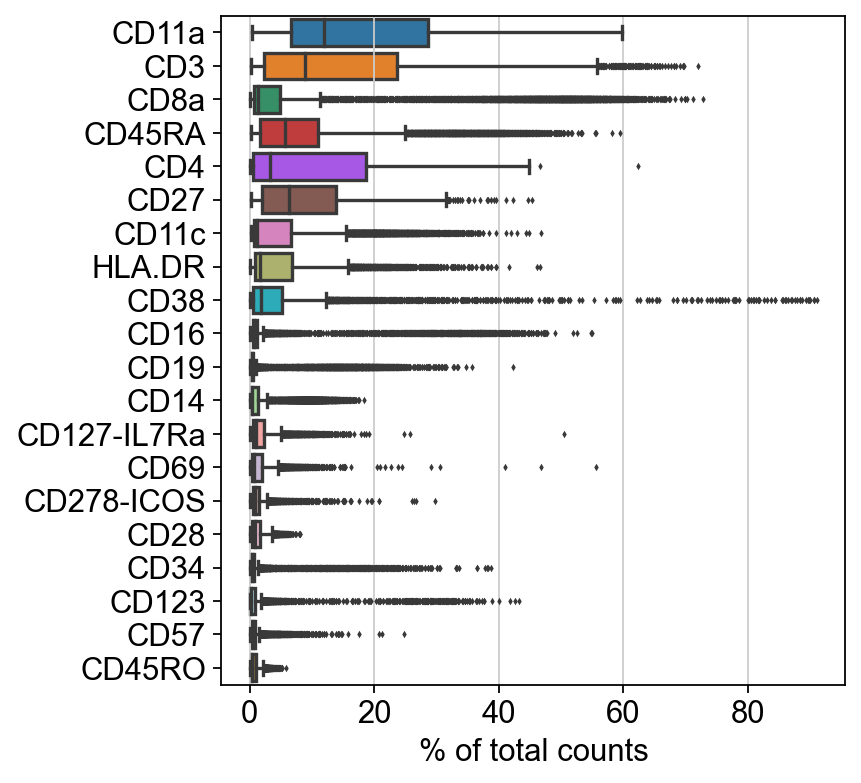

In [14]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(adt_adata, n_top=20)

In [15]:
sc.pp.normalize_total(adt_adata, target_sum=1e4)
sc.pp.log1p(adt_adata)

import scipy.stats.mstats
def clr(adata):
    temp = np.array(adata.X.todense() + 1)
    adata.X = np.log(temp / scipy.stats.mstats.gmean(temp, axis=1).reshape([-1, 1]))
    
# clr(adt_adata)

normalizing counts per cell
    finished (0:00:00)


In [16]:
sc.pp.scale(adt_adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [17]:
sc.tl.pca(adt_adata, svd_solver='arpack')

computing PCA
    with n_comps=24
    finished (0:00:00)


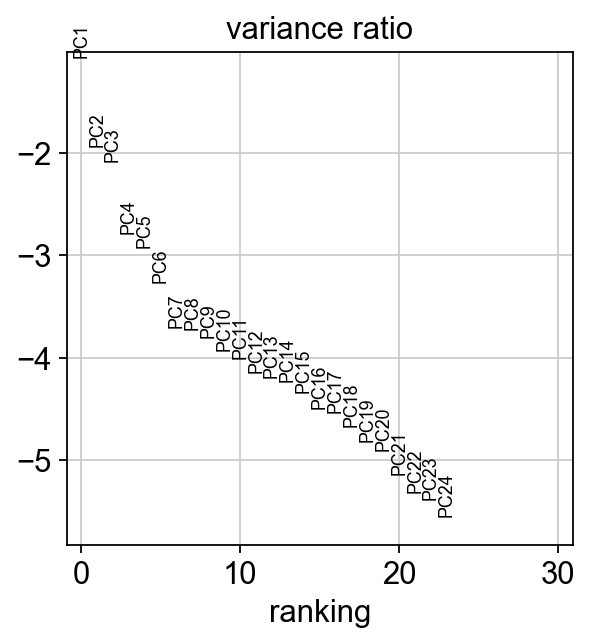

In [18]:
sc.pl.pca_variance_ratio(adt_adata, log=True)

In [19]:
sc.pp.neighbors(adt_adata, n_neighbors=50)
sc.tl.umap(adt_adata)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'orig.ident' as categorical
... storing 'lane' as categorical
... storing 'donor' as categorical
... storing 'celltype.l1' as categorical
... storing 'celltype.l2' as categorical
... storing 'celltype.l1.5' as categorical
... storing 'B cell' as categorical
... storing 'Mono/DC' as categorical
... storing 'NK' as categorical
... storing 'Progenitor cells' as categorical
... storing 'T cell' as categorical
... storing 'celltype.oi' as categorical


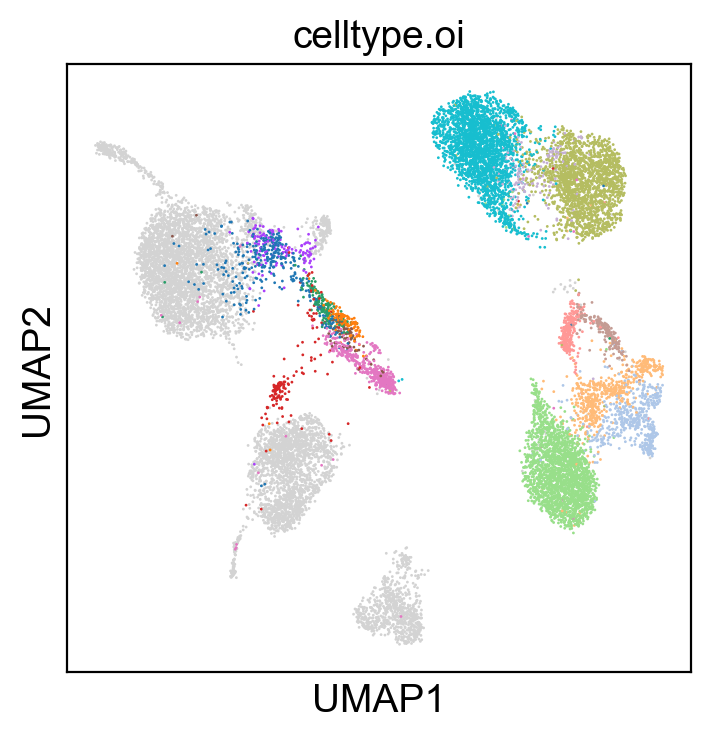

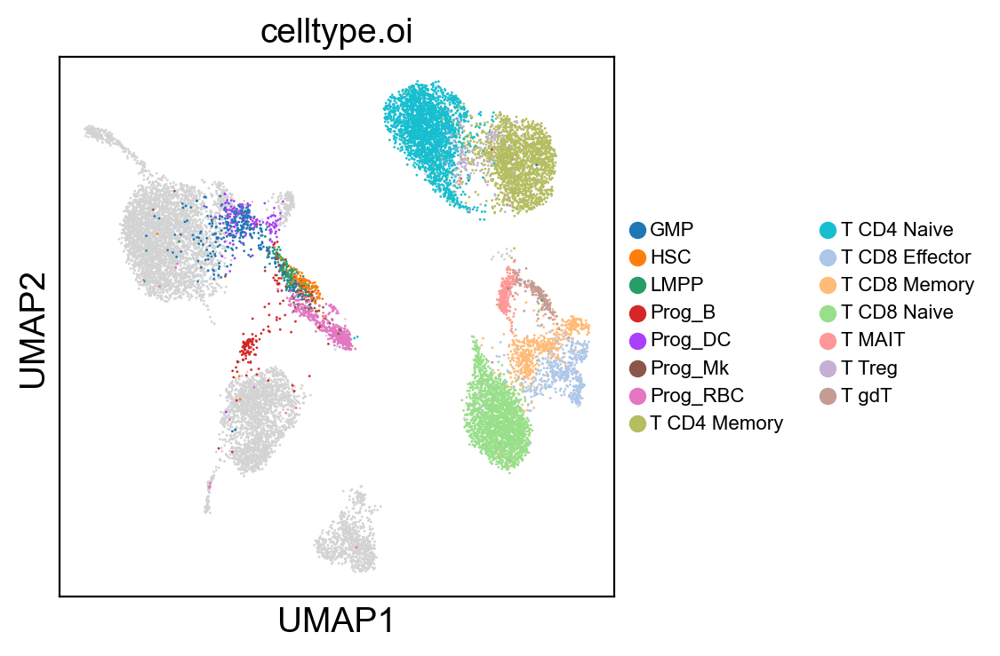

In [20]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adt_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(adt_adata, color=['celltype.oi'], groups=celltype_oi, legend_fontsize=8., size=4.)

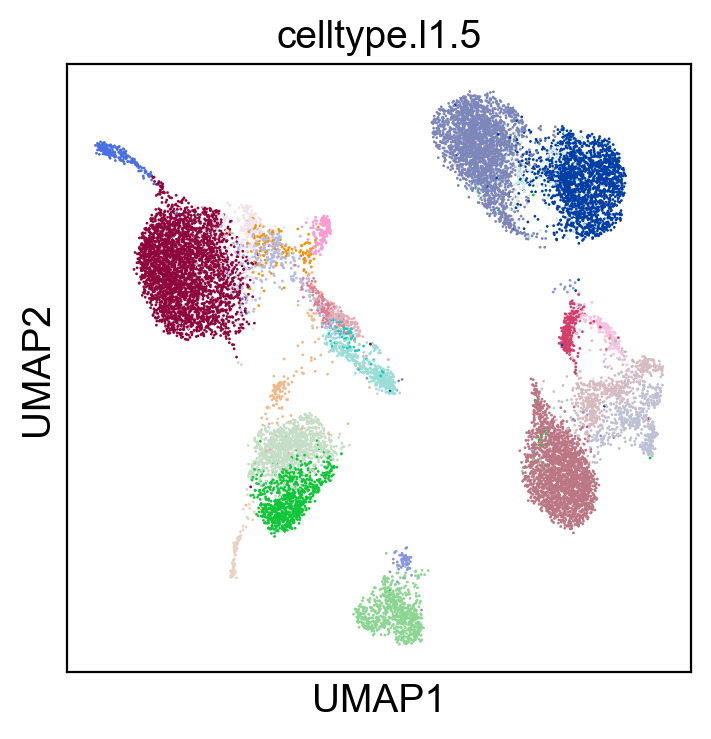

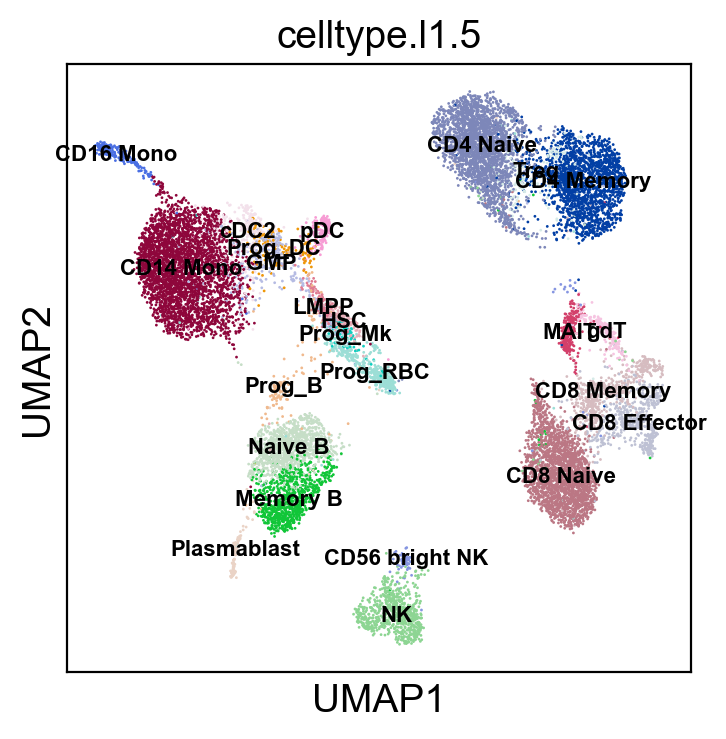

In [21]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adt_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(adt_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=4.)

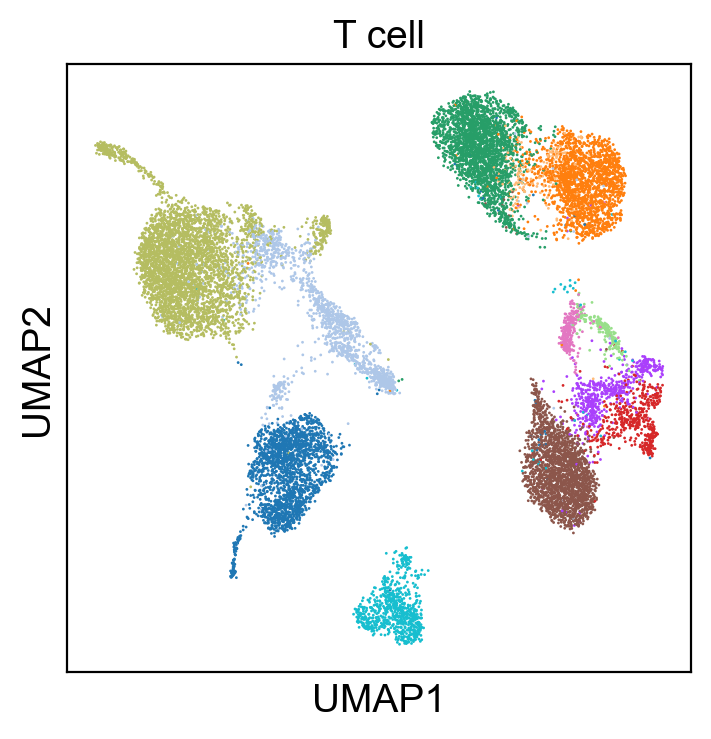

In [22]:
sc.pl.umap(adt_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

## Process RNA

In [23]:
rna_adata = sc.AnnData(sc.read_mtx("../../CITE-seq/bmcn-rna.mtx").T)
rna_adata.obs = pd.read_csv("../../CITE-seq/bmnc-meta.csv")
rna_adata.var_names = pd.read_table("../../CITE-seq/bmcn-rna-features.txt", index_col=0, header=None).index.tolist()

In [24]:
rna_adata = rna_adata[rna_adata.obs.donor == 'batch2']

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [25]:
rna_adata.obs = adt_adata.obs.copy()

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


normalizing counts per cell
    finished (0:00:00)


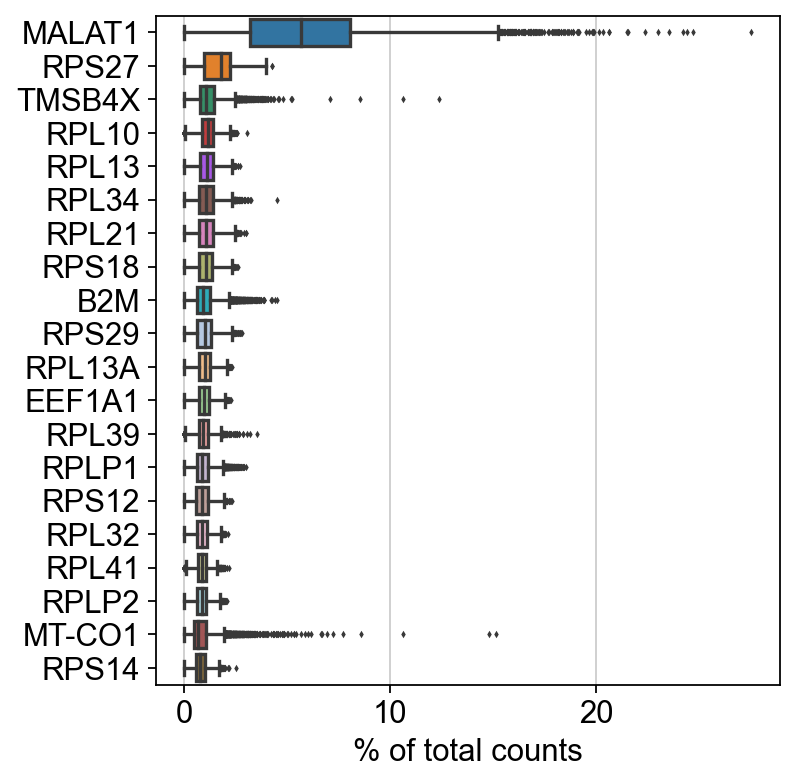

In [26]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(rna_adata, n_top=20)

In [27]:
sc.pp.normalize_total(rna_adata, target_sum=1e4)
sc.pp.log1p(rna_adata)

normalizing counts per cell
    finished (0:00:00)


In [28]:
#sc.pp.highly_variable_genes(rna_adata)
#sc.pl.highly_variable_genes(rna_adata)
#rna_adata.var.highly_variable.sum()

In [29]:
#rna_adata = rna_adata[:, rna_adata.var.highly_variable]

In [30]:
sc.pp.scale(rna_adata, max_value=10)
sc.tl.pca(rna_adata, svd_solver='arpack')

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:25)


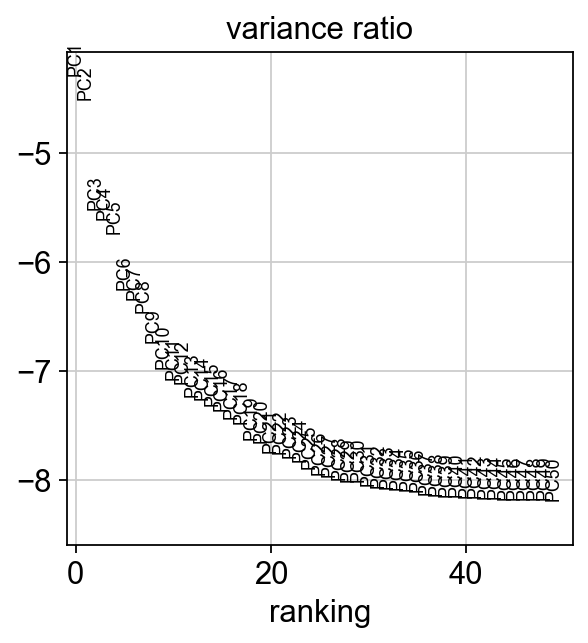

In [31]:
sc.pl.pca_variance_ratio(rna_adata, log=True, n_pcs=50)

In [32]:
sc.pp.neighbors(rna_adata, n_neighbors=40, n_pcs=50)
sc.tl.umap(rna_adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


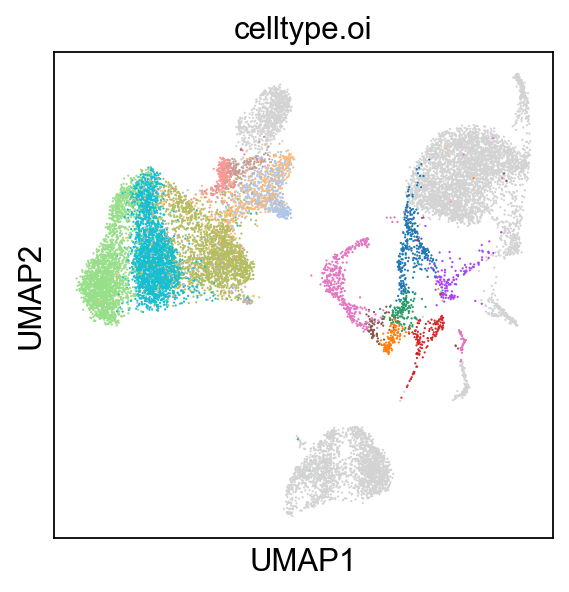

In [33]:
sc.pl.umap(rna_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=4.)

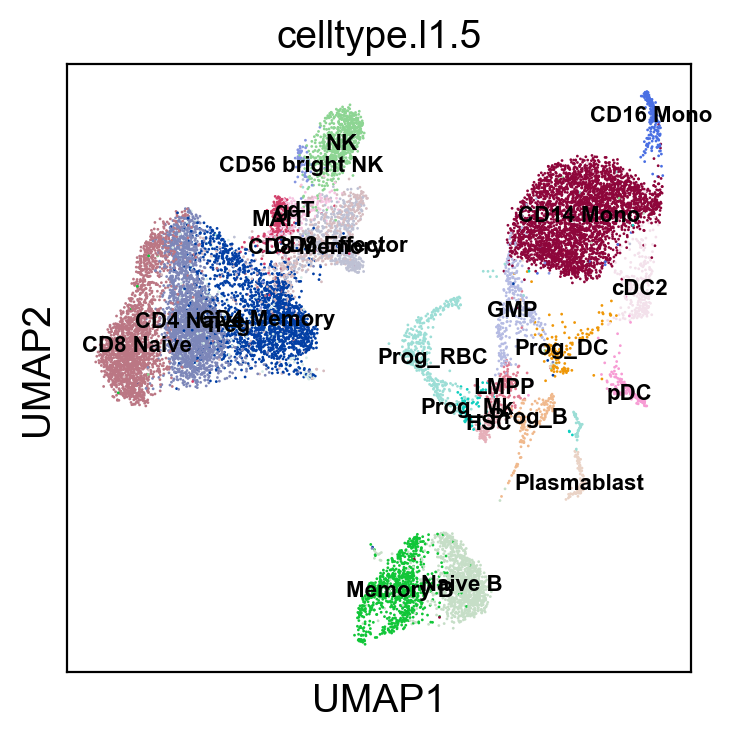

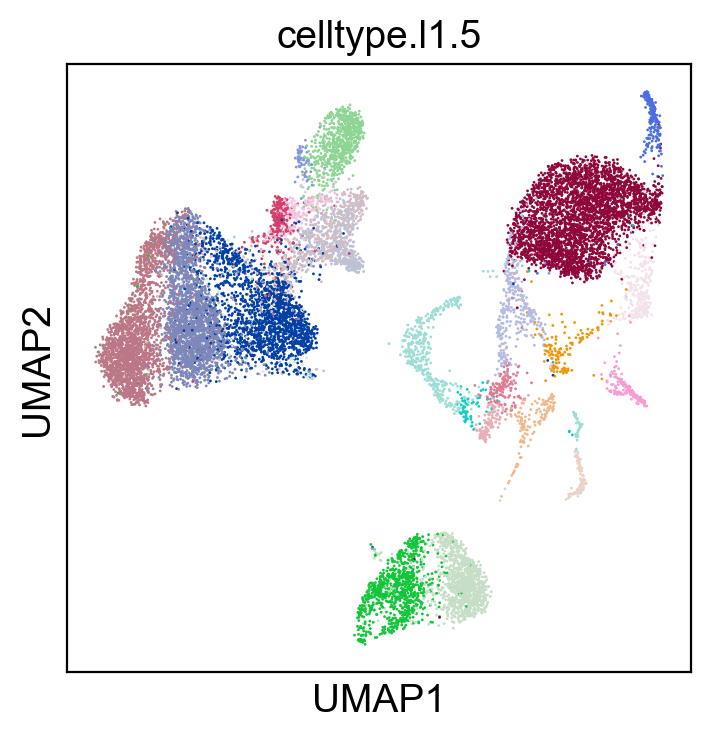

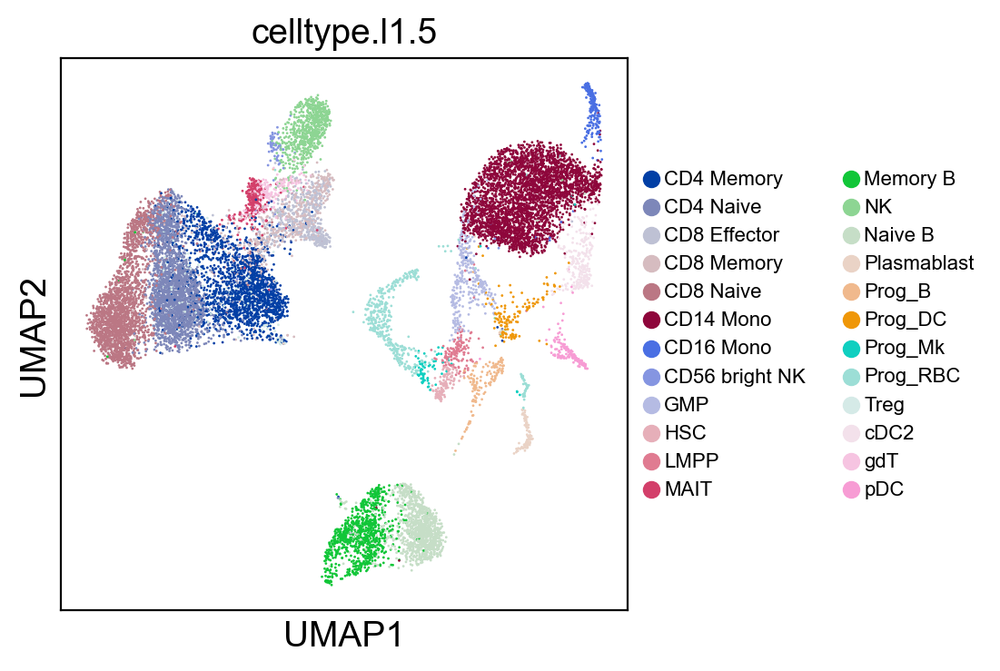

In [34]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=4.)
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_fontsize=8., size=4.)

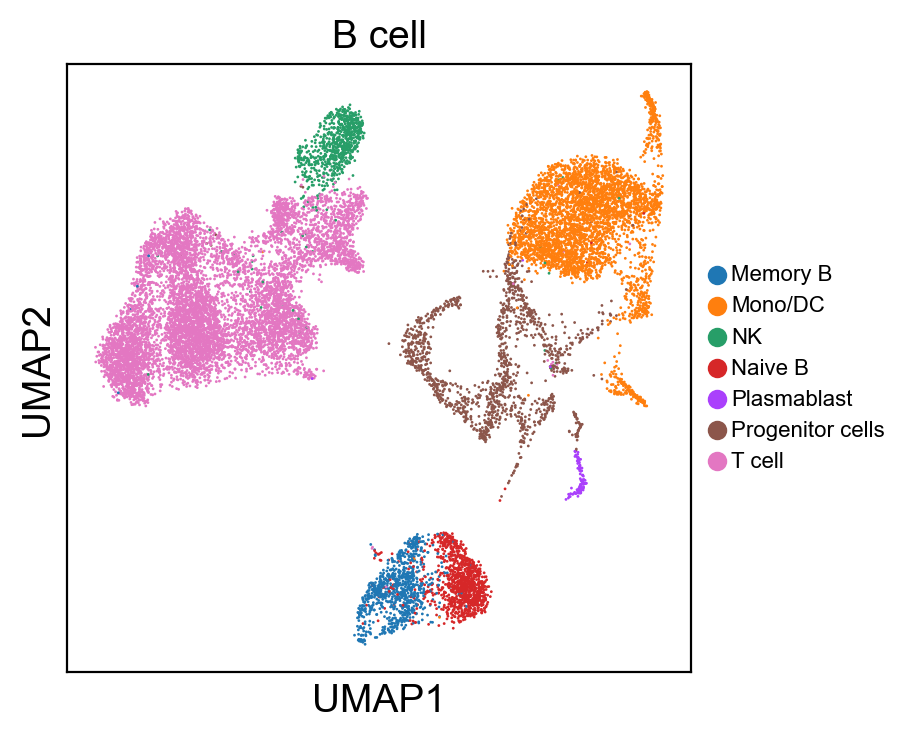

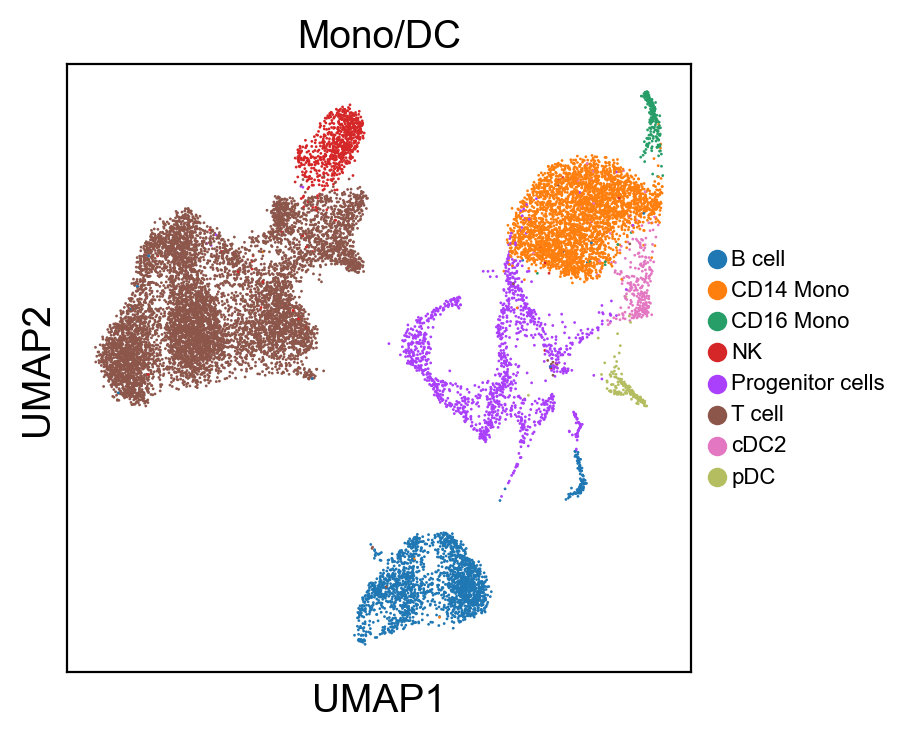

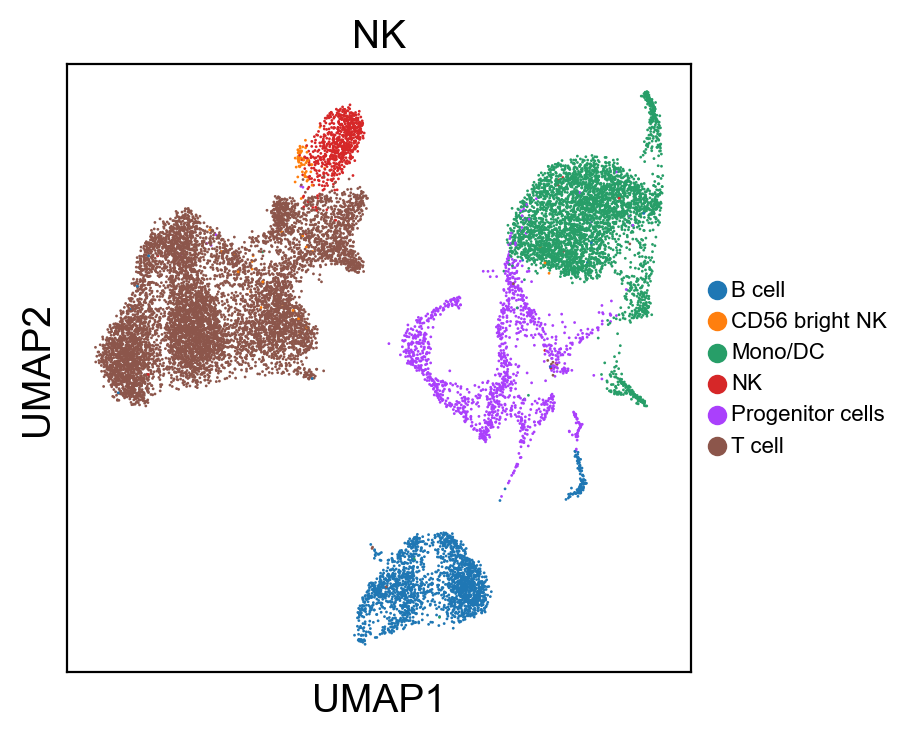

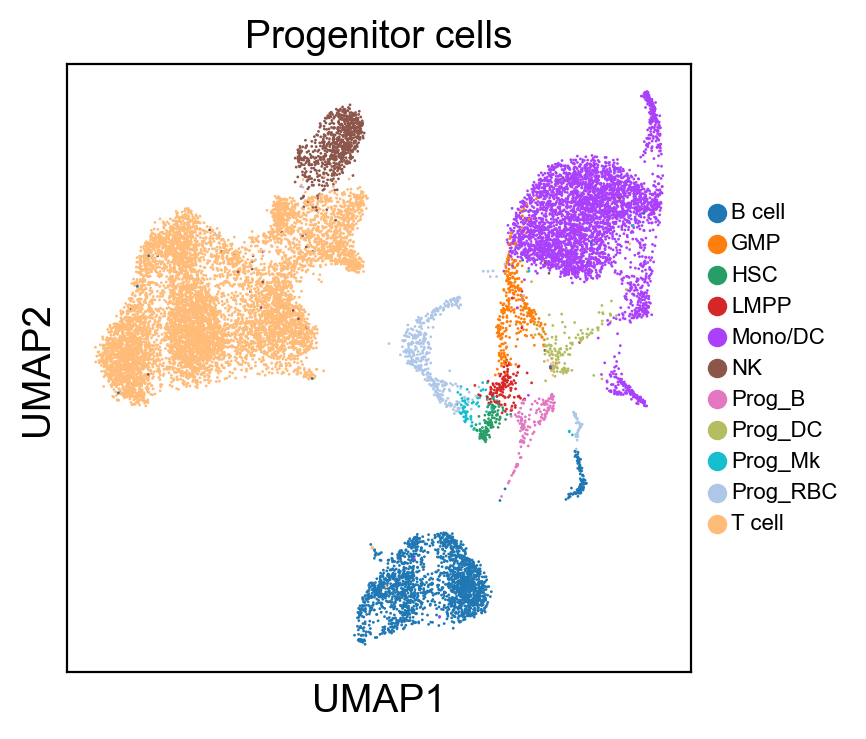

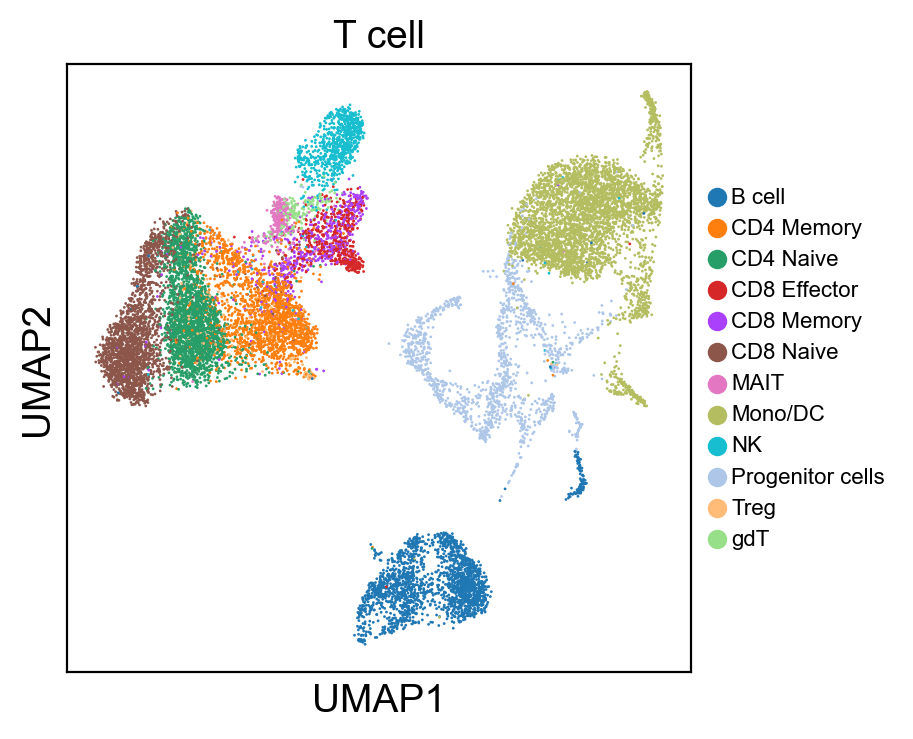

In [35]:
for g in groups:
    sc.pl.umap(rna_adata, color=[g], legend_fontsize=8., size=4.)

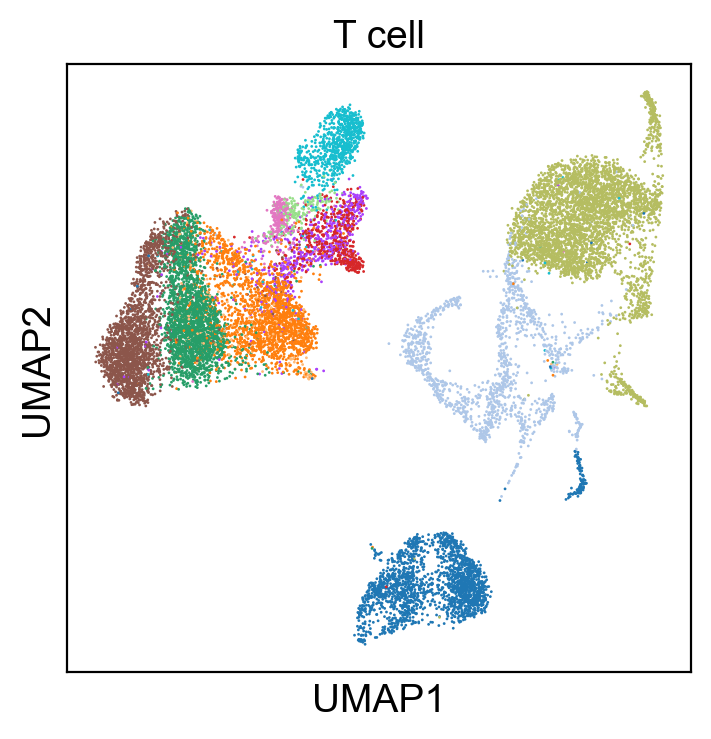

In [36]:
sc.pl.umap(rna_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

## Compare Protein Profile with Gene Expression Profile

In [37]:
rna_adata.var_names[rna_adata.var_names.str.contains('ITGA')]

Index(['ITGA10', 'ITGA6', 'ITGA4', 'ITGAV', 'ITGA9', 'ITGA1', 'ITGA2', 'ITGA8',
       'ITGA5', 'ITGA7', 'ITGAL', 'ITGAM', 'ITGAX', 'ITGAE', 'ITGA2B',
       'ITGA3'],
      dtype='object')

In [38]:
coding_genes = {
    'CD11a': ['ITGAL'],
    'CD11c': ['ITGAX'],
    'CD123': ['IL3RA'],
    'CD127-IL7Ra': ['IL7R'],
    'CD14': ['CD14'],
    'CD16': ['FCGR3A', 'FCGR3B'],
    'CD161': ['KLRB1'],
    'CD19': ['CD19'],
    'CD197-CCR7': ['CCR7'],
    'CD25': ['IL2RA'],
    'CD27': ['CD27'],
    'CD278-ICOS': ['ICOS'],
    'CD28': ['CD28'],
    'CD3': ['CD3D', 'CD3E', 'CD3G'],
    'CD34': ['CD34'],
    'CD38': ['CD38'],
    'CD4': ['CD4'],
    'CD45RA': ['PTPRC'],
    'CD45RO': ['PTPRC'],
    'CD56': ['NCAM1'],
    'CD57': ['B3GAT1'],
    'CD69': ['CD69'],
    'CD79b': ['CD79B'],
    'CD8a': ['CD8A'],
    'HLA.DR': ['HLA-DRA', 'HLA-DRB1']
}

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


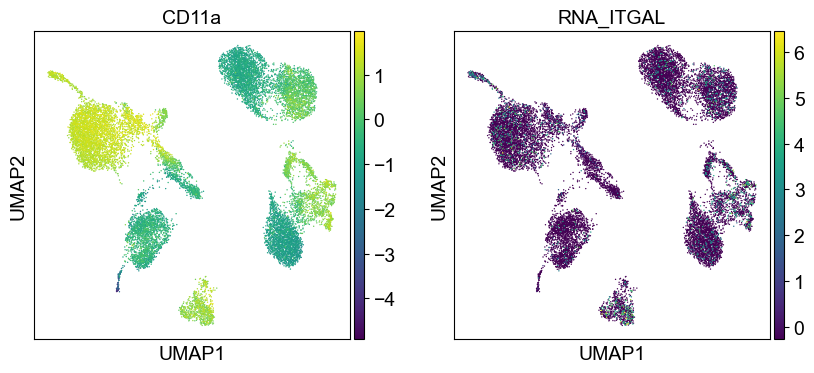

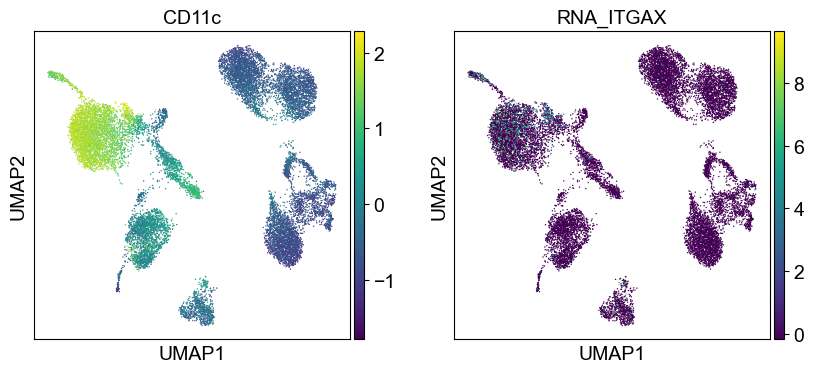

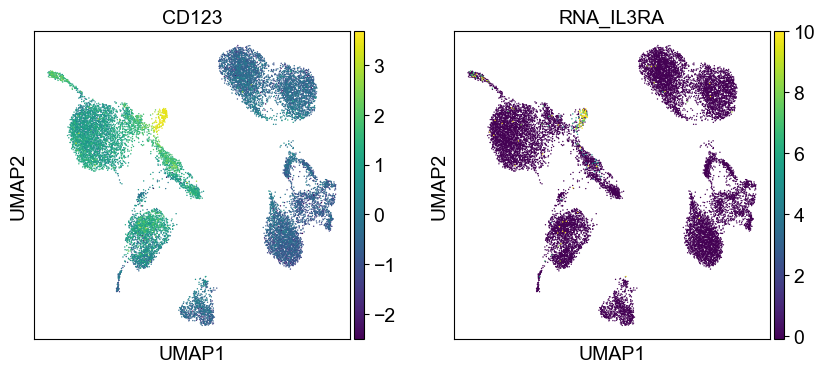

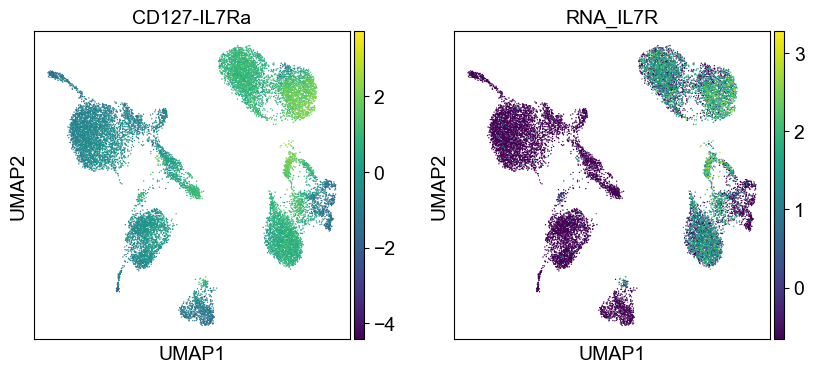

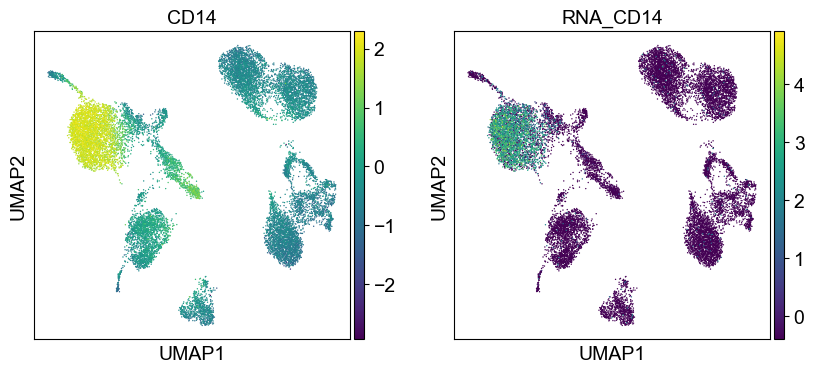

...

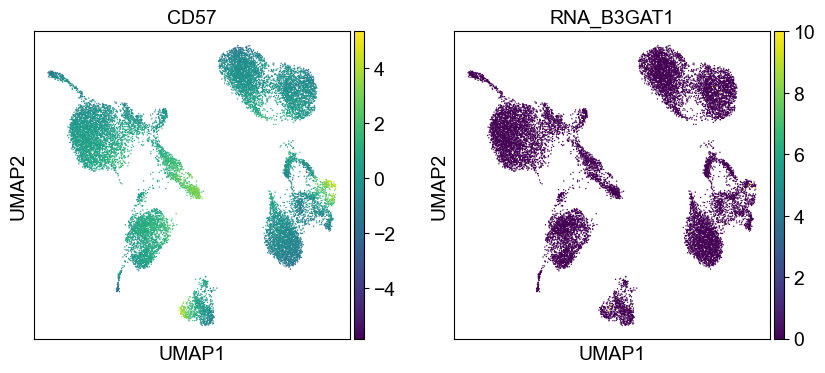

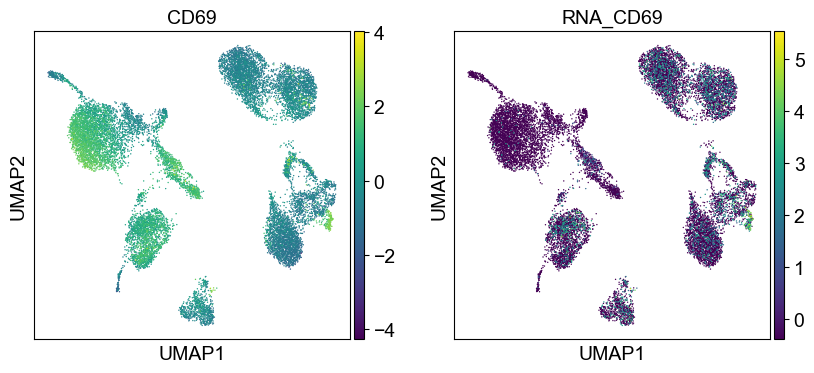

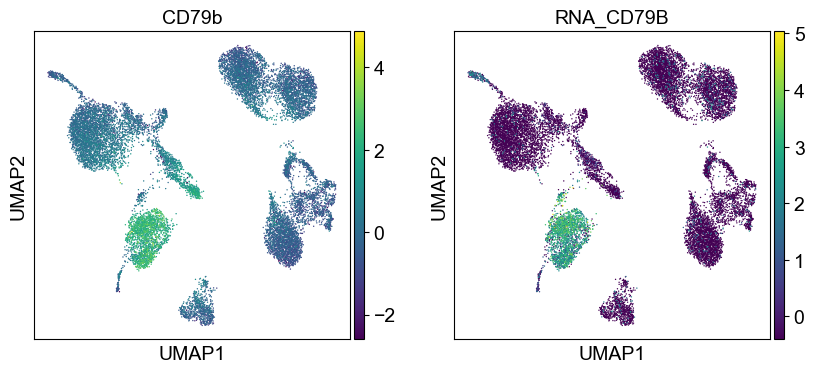

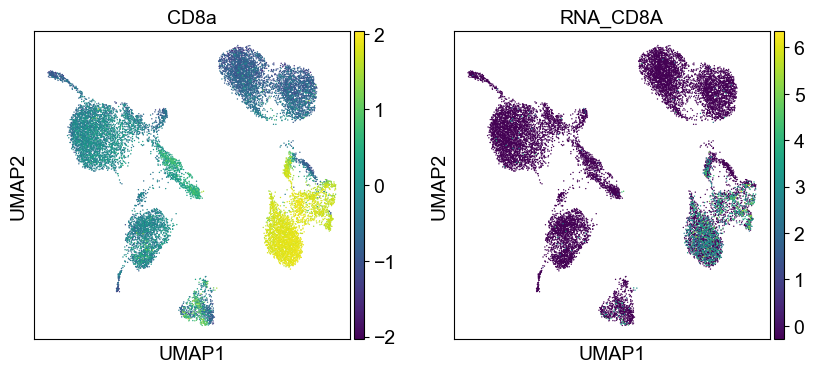

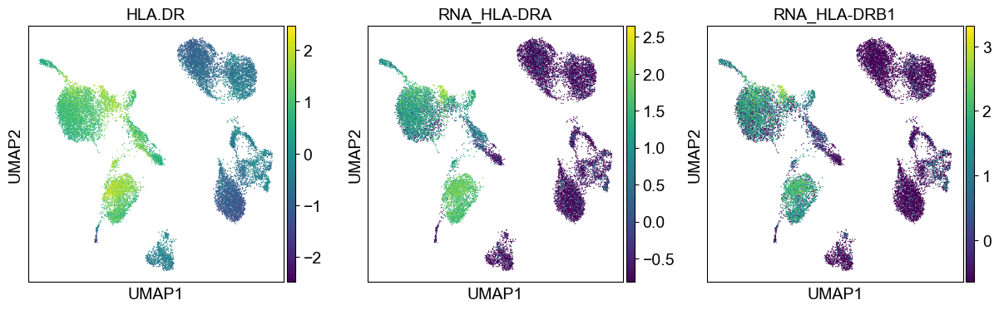

In [39]:
sc.settings.set_figure_params(dpi=50, facecolor='white')
temp_adata = adt_adata.copy()
for i in coding_genes:
    for j in coding_genes[i]:
        temp_adata.obs['RNA_' + j] = rna_adata[:, j].X.squeeze().tolist()
    sc.pl.umap(temp_adata, color=[i] + ['RNA_' + j for j in coding_genes[i]], legend_fontsize=8., size=4.)

### Use genes encoding these proteins for embedding

In [40]:
coding_adata = rna_adata.copy()[:, sum(coding_genes.values(), [])]
coding_adata

View of AnnData object with n_obs × n_vars = 16204 × 29
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight', 'celltype.l1.5', 'B cell', 'Mono/DC', 'NK', 'Progenitor cells', 'T cell', 'celltype.oi'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'celltype.oi_colors', 'celltype.l1.5_colors', 'B cell_colors', 'Mono/DC_colors', 'NK_colors', 'Progenitor cells_colors', 'T cell_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [41]:
sc.tl.pca(coding_adata, svd_solver='arpack')

computing PCA
    with n_comps=28


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00)


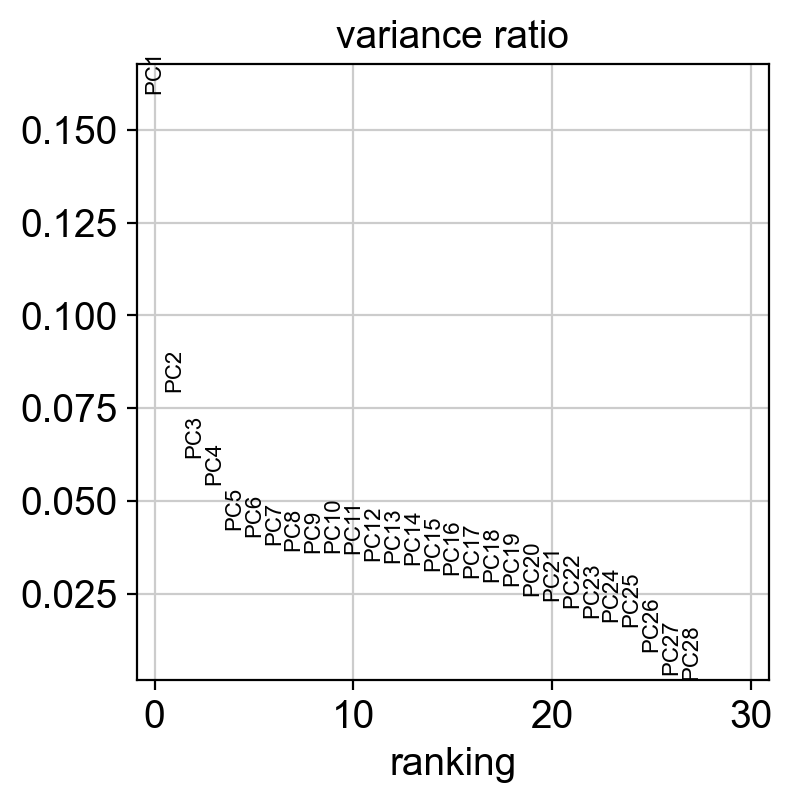

In [42]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.pca_variance_ratio(coding_adata)

In [43]:
sc.pp.neighbors(coding_adata, n_pcs=5, use_rep="X_pca")
sc.tl.umap(coding_adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


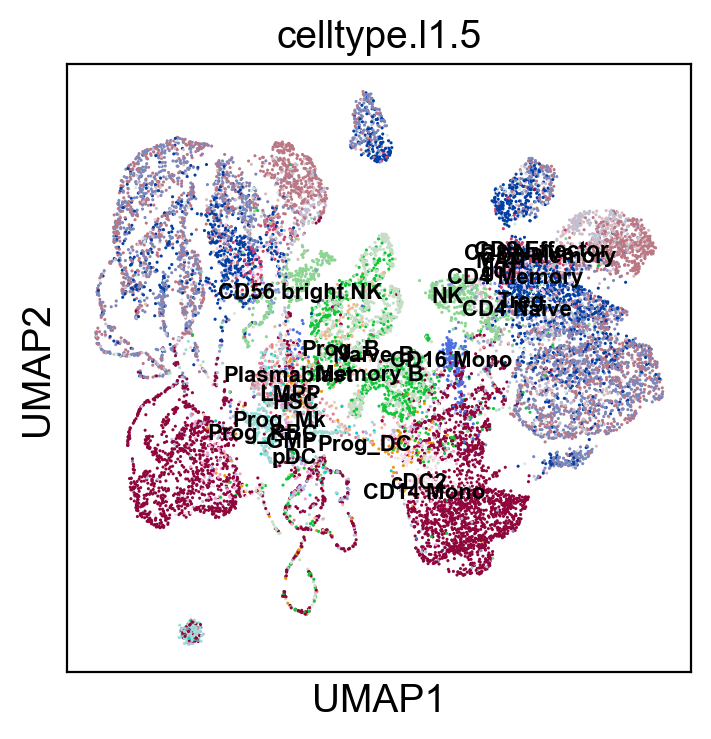

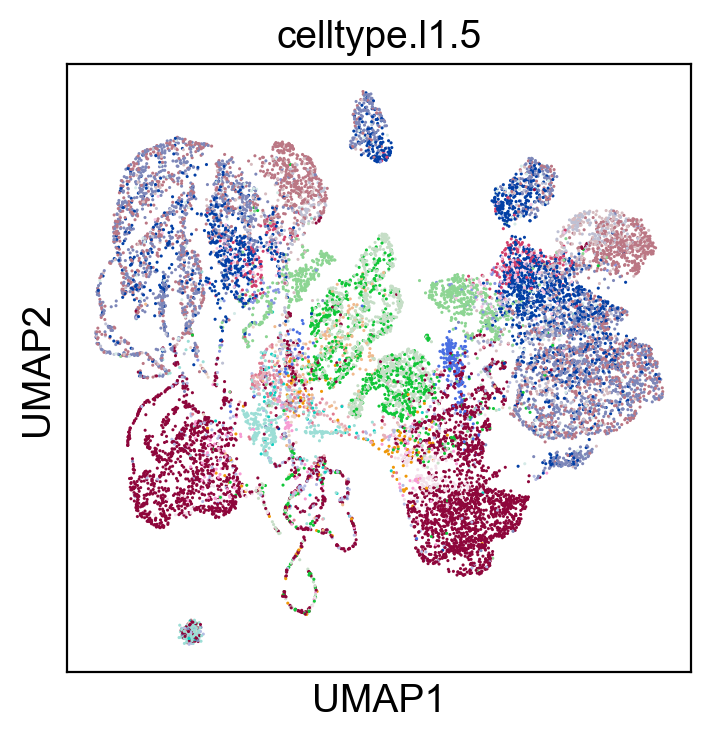

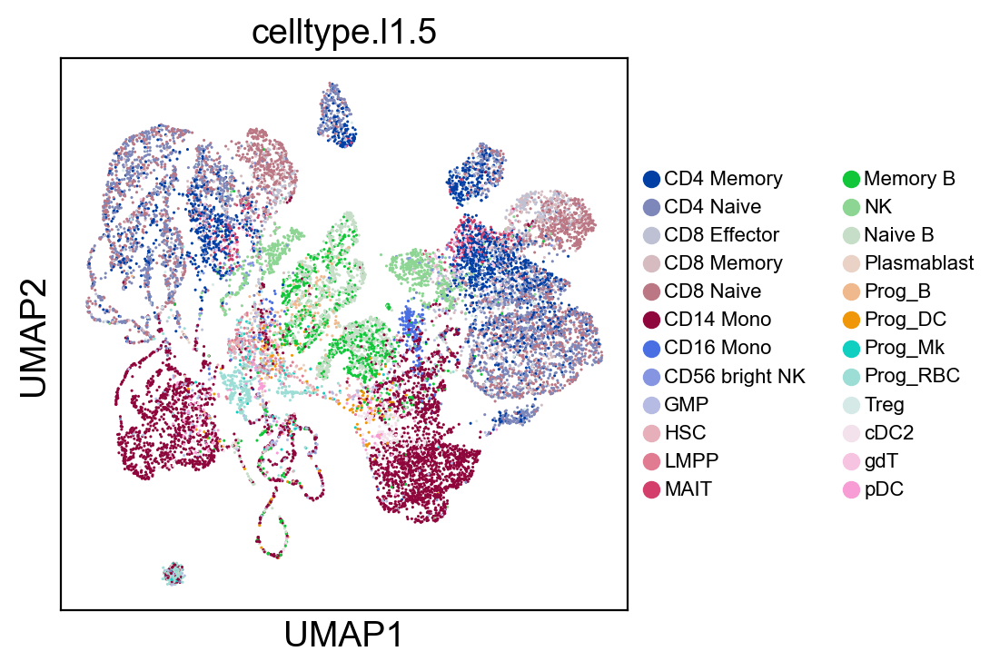

In [44]:
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=5.)
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=5.)
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_fontsize=8., size=5.)

## Validation

In [46]:
w_df = pd.read_csv("bmnc-140.csv", index_col=0)

In [47]:
new_adata = rna_adata.copy()[:, w_df.index.tolist()]

sc.tl.pca(new_adata, svd_solver='arpack')
new_adata

computing PCA
    with n_comps=50


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:00)


AnnData object with n_obs × n_vars = 16204 × 140
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight', 'celltype.l1.5', 'B cell', 'Mono/DC', 'NK', 'Progenitor cells', 'T cell', 'celltype.oi'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'celltype.oi_colors', 'celltype.l1.5_colors', 'B cell_colors', 'Mono/DC_colors', 'NK_colors', 'Progenitor cells_colors', 'T cell_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

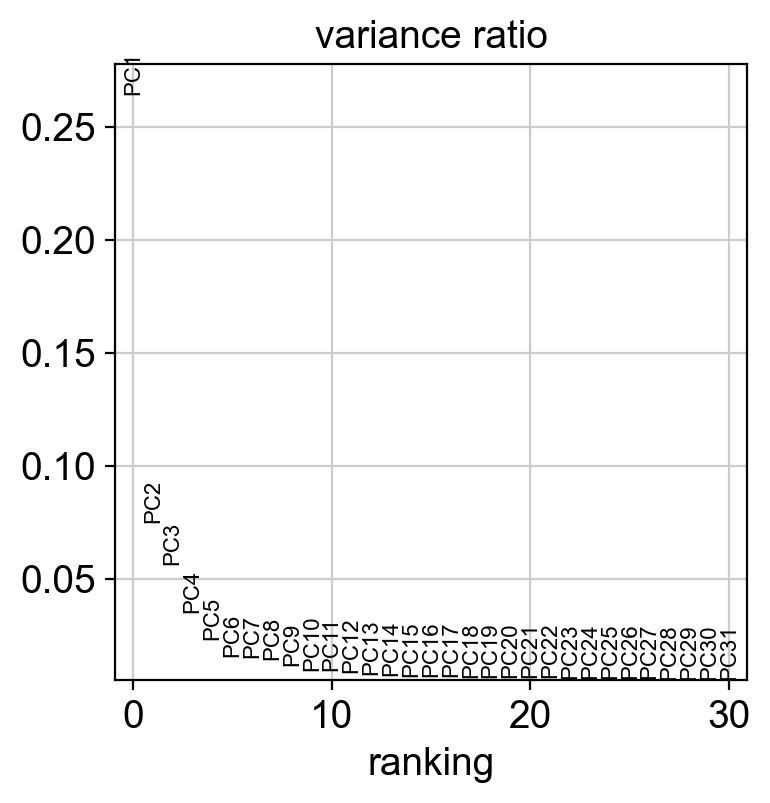

In [48]:
sc.pl.pca_variance_ratio(new_adata)

In [57]:
sc.pp.neighbors(new_adata, n_pcs=14, use_rep="X_pca")
sc.tl.umap(new_adata, random_state=2)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


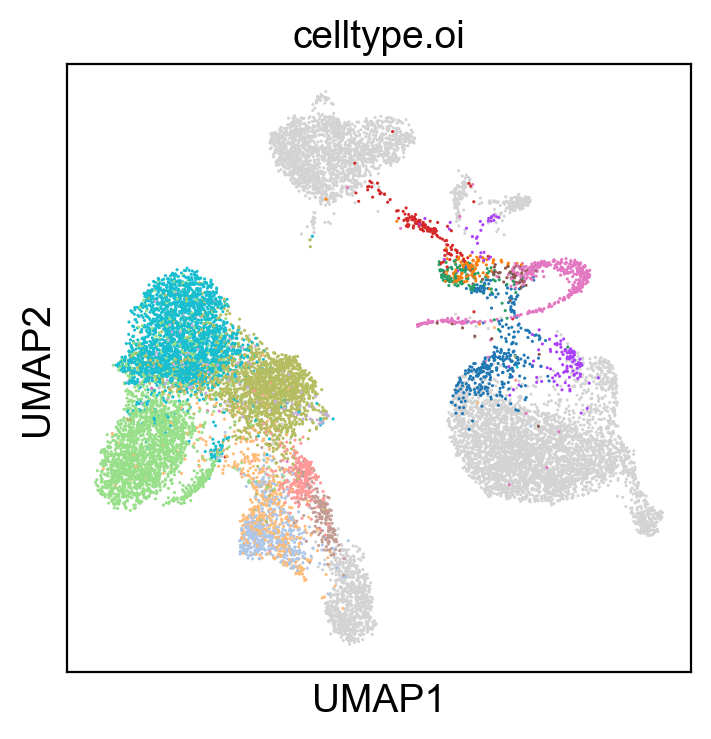

In [58]:
sc.pl.umap(new_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=5.)

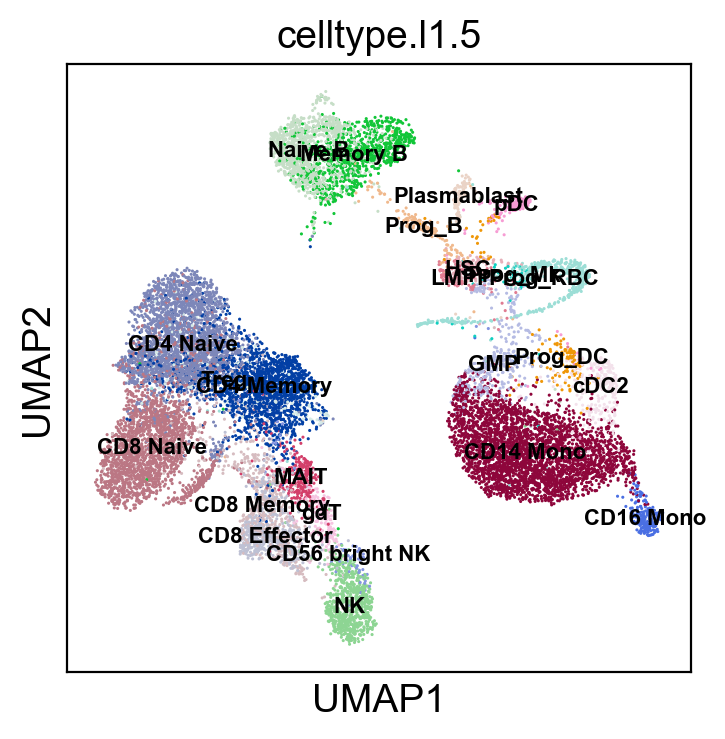

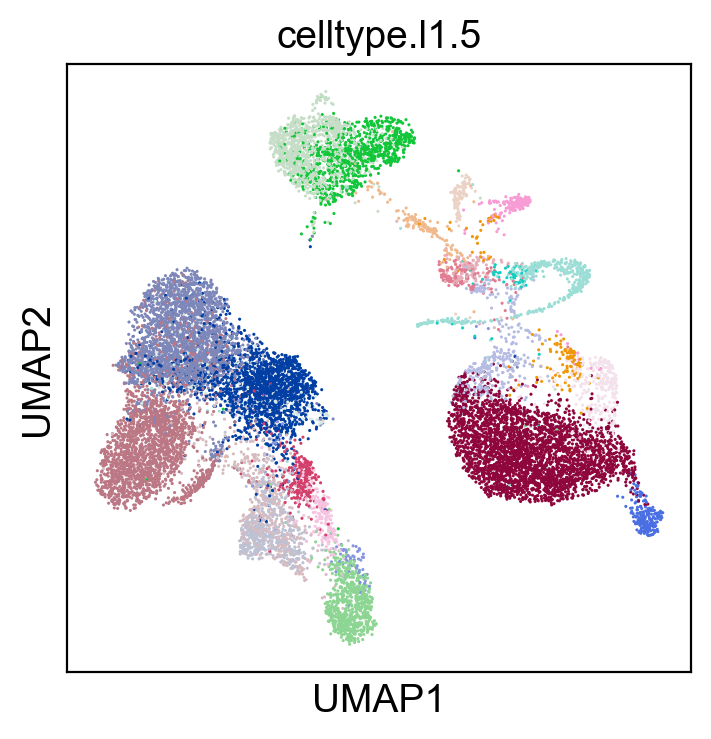

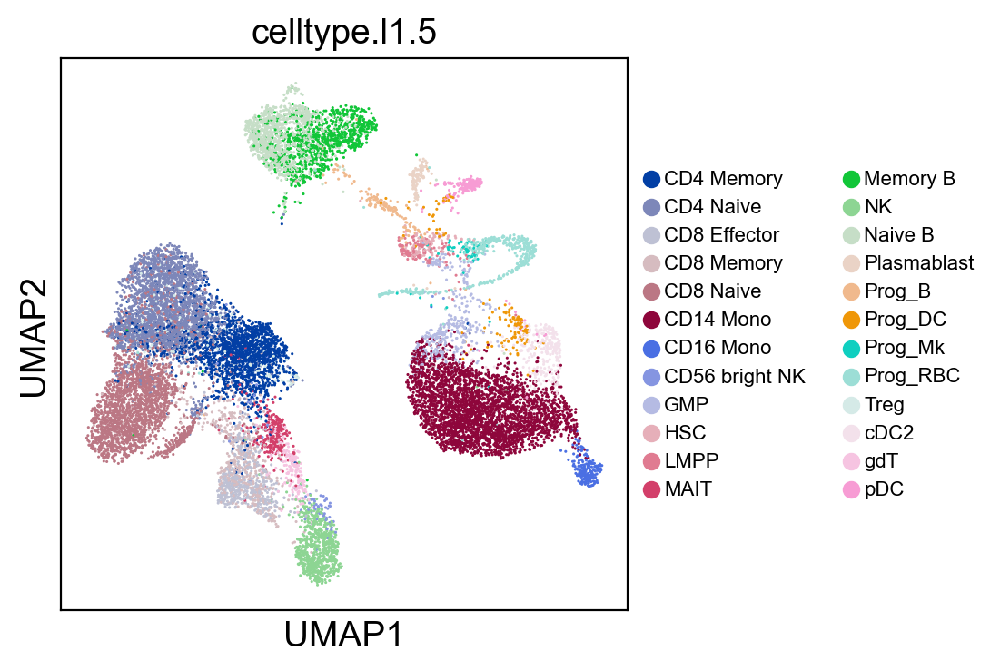

In [59]:
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=5.)
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=5.)
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_fontsize=8., size=5.)

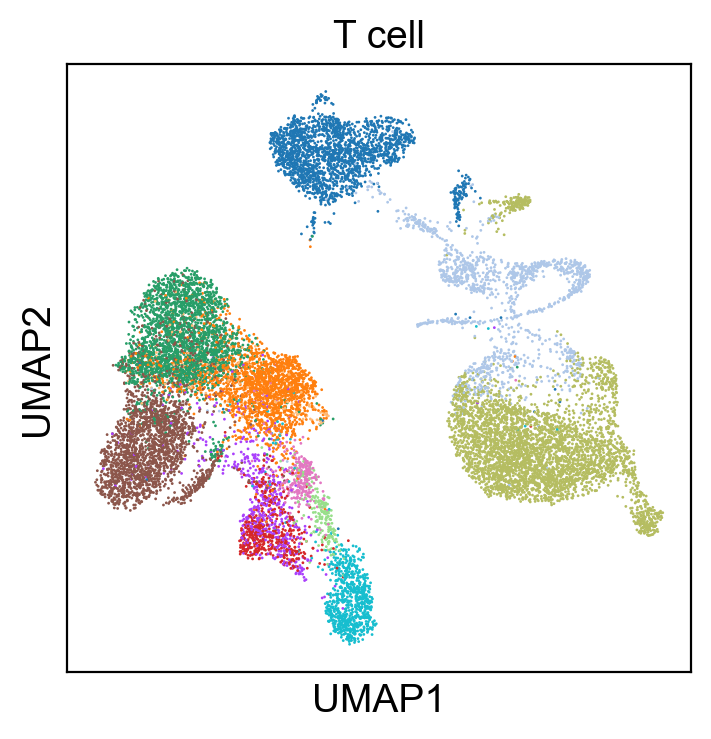

In [52]:
sc.pl.umap(new_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

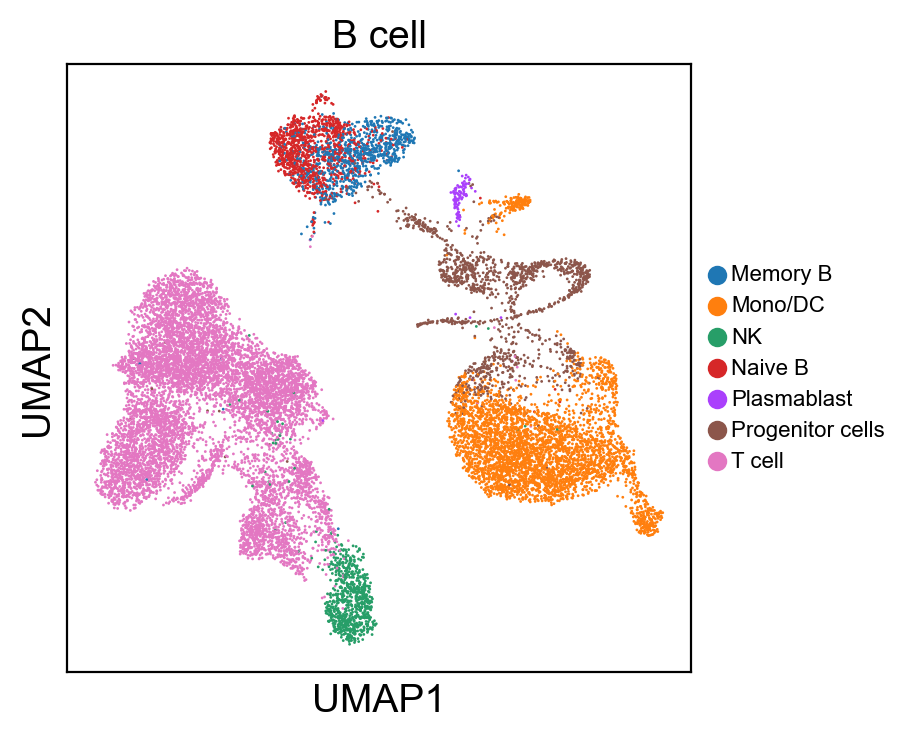

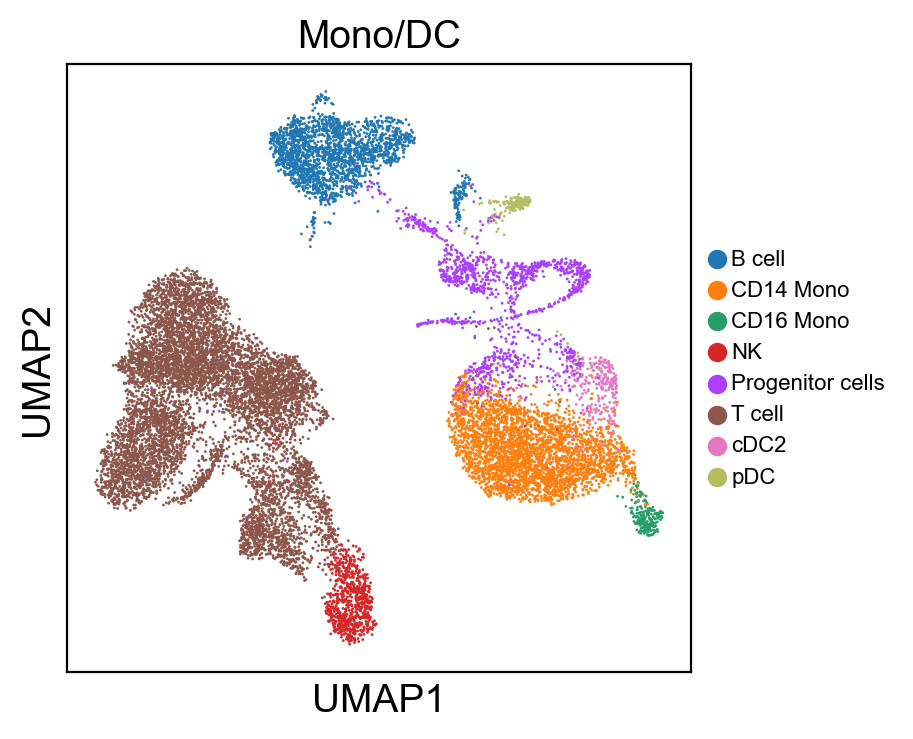

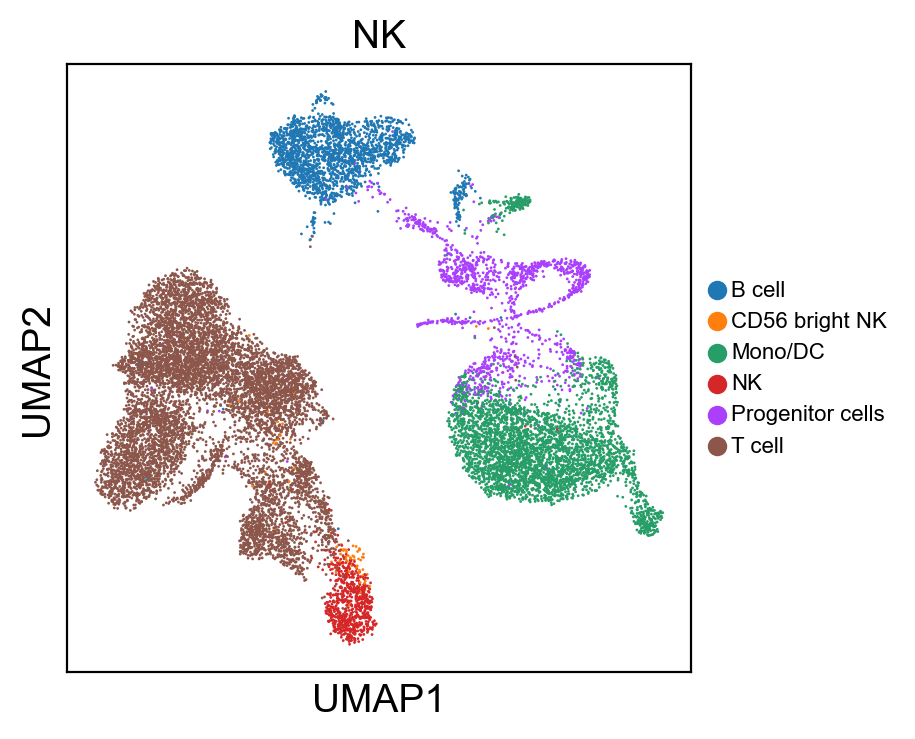

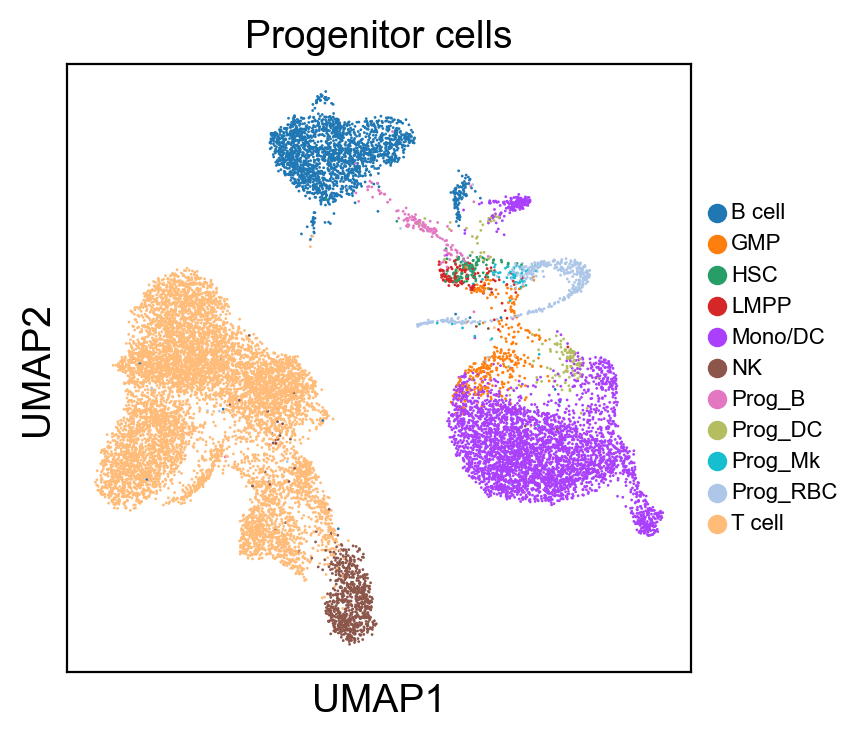

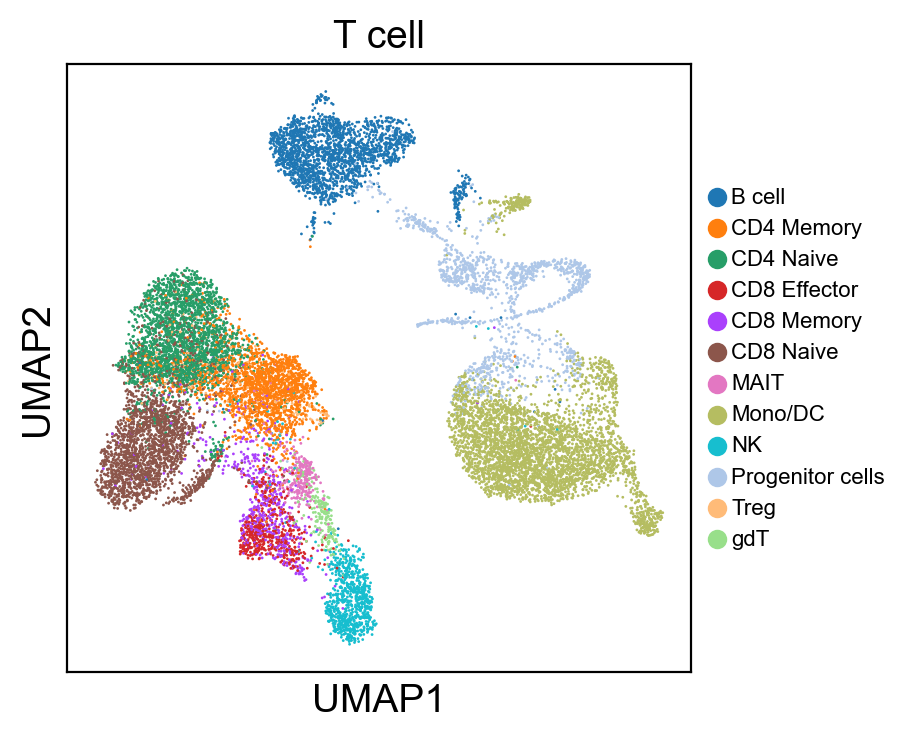

In [53]:
for g in groups:
    sc.pl.umap(new_adata, color=[g], legend_fontsize=8., size=4.)